In [1]:
import os 
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from keras.preprocessing.image import ImageDataGenerator
from tensorflow import keras 
from keras.callbacks import EarlyStopping,ModelCheckpoint
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tqdm import tqdm
from imblearn.over_sampling import SMOTE

In [2]:
import skimage.io
from tensorflow.keras.applications.resnet50 import ResNet50
from skimage.io import imread, imshow
from skimage.transform import resize
from tensorflow.keras.layers import InputLayer,GlobalAveragePooling2D, BatchNormalization, Dropout, Flatten, Dense, Activation, MaxPool2D, Conv2D,TimeDistributed, LSTM
from tensorflow.keras.models import Sequential

In [130]:
from PIL import Image
from scipy.stats import skew

In [3]:
data_dir = "./Alzheimers-ADNI/train"
classes = ['Final AD JPEG', 'Final CN JPEG', 'Final EMCI JPEG', 'Final LMCI JPEG', 'Final MCI JPEG']
print(os.listdir(data_dir))

['Final AD JPEG', 'Final CN JPEG', 'Final EMCI JPEG', 'Final LMCI JPEG', 'Final MCI JPEG']


In [5]:
images = []
labels = []
for subfolder in tqdm(os.listdir('./Alzheimers-ADNI')):
    subfolder_path = os.path.join('./Alzheimers-ADNI', subfolder)
    for folder in os.listdir(subfolder_path):
        subfolder_path2=os.path.join(subfolder_path,folder)
        for image_filename in os.listdir(subfolder_path2):
            image_path = os.path.join(subfolder_path2, image_filename)
            images.append(image_path)
            labels.append(folder)
df = pd.DataFrame({'image': images, 'label': labels})

def remove_jpeg(label):
    return label.replace(' JPEG', '')
df['label'] = df['label'].apply(remove_jpeg)
df

100%|██████████| 2/2 [00:00<00:00, 24.56it/s]


,image,label
0,./Alzheimers-ADNI\test\Final AD JPEG\ADNI_002_...,Final AD
1,./Alzheimers-ADNI\test\Final AD JPEG\ADNI_006_...,Final AD
2,./Alzheimers-ADNI\test\Final AD JPEG\ADNI_012_...,Final AD
3,./Alzheimers-ADNI\test\Final AD JPEG\ADNI_013_...,Final AD
4,./Alzheimers-ADNI\test\Final AD JPEG\ADNI_024_...,Final AD
...,...,...
1291,./Alzheimers-ADNI\train\Final MCI JPEG\ADNI_30...,Final MCI
1292,./Alzheimers-ADNI\train\Final MCI JPEG\ADNI_30...,Final MCI
1293,./Alzheimers-ADNI\train\Final MCI JPEG\ADNI_30...,Final MCI
1294,./Alzheimers-ADNI\train\Final MCI JPEG\ADNI_94...,Final MCI


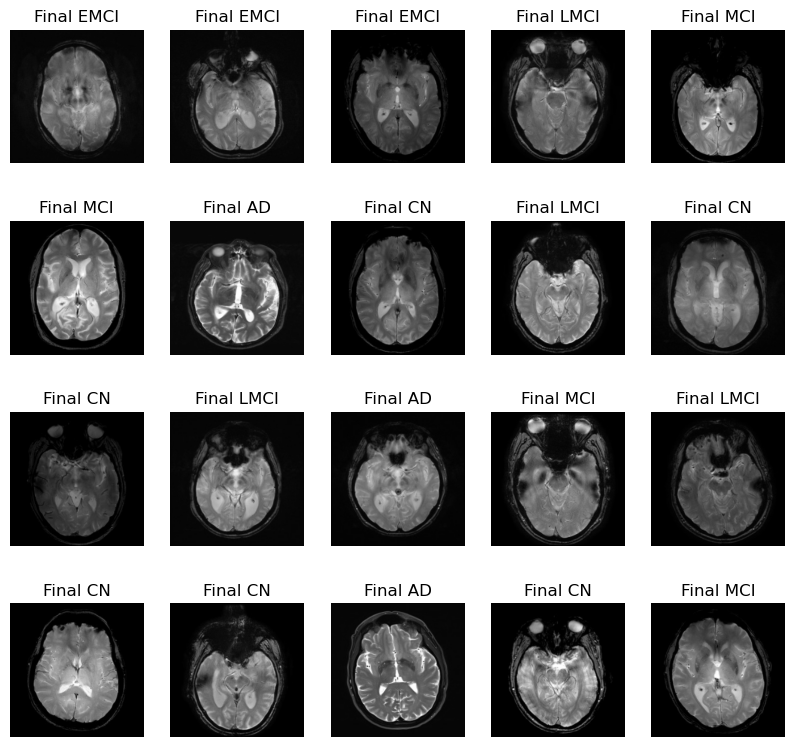

In [6]:
plt.figure(figsize=(10,12))
for n,i in enumerate(np.random.randint(0,len(df),20)):
    plt.subplot(5,5,n+1)
    img=cv2.imread(df.image[i])
    img=cv2.resize(img,(224,224))
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis('off')
    plt.title(df.label[i],fontsize=12)

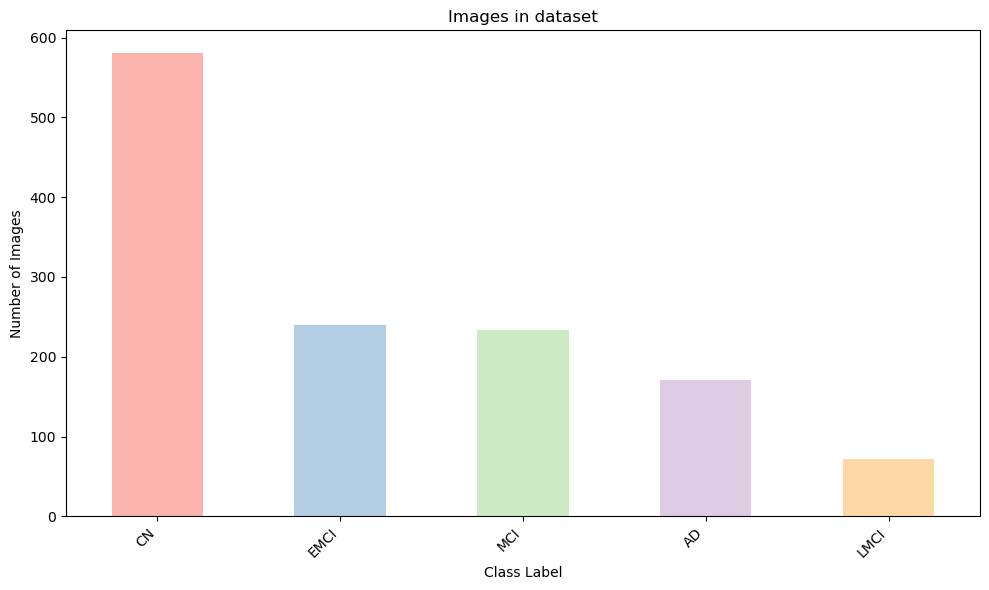

In [86]:
class_counts = df['label'].value_counts()
class_mapping = {
    'Final CN': 'CN',
    'Final EMCI': 'EMCI',
    'Final MCI': 'MCI',
    'Final AD': 'AD',
    'Final LMCI': 'LMCI'
}

class_counts.index = class_counts.index.map(class_mapping)

plt.figure(figsize=(10, 6))
colors = plt.cm.Pastel1.colors 
class_counts.plot(kind='bar', color=colors)
plt.title('Images in dataset')
plt.xlabel('Class Label')
plt.ylabel('Number of Images')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [134]:
from PIL import Image
def load_image(image_path):
    return Image.open(image_path)

image_objects = []
for image_path in tqdm(images):
    image_object = load_image(image_path)
    image_objects.append(image_object)

100%|██████████| 1296/1296 [00:00<00:00, 3766.05it/s]


In [135]:
def get_image_stats(image_objects, labels):
    means, stds, widths, heights = [], [], [], []
    skewnesses = []
    
    for image in tqdm(image_objects):
        image_array = np.array(image)
        means.append(np.mean(image_array))
        stds.append(np.std(image_array))
        widths.append(image.width)
        heights.append(image.height)
        image_hist = np.histogram(image_array.flatten())[0]
        skewnesses.append(skew(image_hist))
    
    image_stats = pd.DataFrame({
        'mean': means,
        'std': stds,
        'width': widths,
        'height': heights,
        'skew': skewnesses
    })
    image_stats['label'] = labels
    return image_stats


image_objects = [load_image(image_path) for image_path in images]    

In [136]:
image_stats = get_image_stats(image_objects, labels)

100%|██████████| 1296/1296 [00:07<00:00, 179.98it/s]


In [137]:
import plotly.express as px

In [138]:
dist = df['label'].value_counts(normalize=True)
dist = dist.reset_index()
dist.columns = ['label', 'percentage']
dist['percentage'] = dist['percentage'] * 100
dist = dist.sort_values(by='label')

sampled_image_stats = pd.DataFrame()
for label in dist['label'].unique():
    sampled_image_stats = pd.concat([sampled_image_stats, image_stats[df['label'] == label].sample(n=100, random_state=42,replace=True)])

sampled_image_stats = sampled_image_stats.reset_index(drop=True)

In [139]:
label_mapping = {'Final AD JPEG':'AD', 'Final CN JPEG': 'CN', 'Final EMCI JPEG': 'EMCI', 'Final LMCI JPEG': 'LMCI', 'Final MCI JPEG':'MCI'}
sampled_image_stats['label'] = sampled_image_stats['label'].map(label_mapping)

In [140]:
fig = px.scatter_3d(sampled_image_stats, x='mean', y='std', z='skew', color='label', title='3D Scatter Plot of Image Statistics',width=800, height=800)
fig.show()

In [6]:
Size=(256,256)
work_dr = ImageDataGenerator(
    rescale = 1./255
)
train_data_gen = work_dr.flow_from_dataframe(df,x_col='image',y_col='label', target_size=Size, batch_size=1200, shuffle=False)

Found 1296 validated image filenames belonging to 5 classes.


In [7]:
train_data, train_labels = train_data_gen.next()
for alzheimers_class in classes:
    container = []
    temp_dir = data_dir + "/" + alzheimers_class
    for file in os.listdir(temp_dir):
        container.append(file)
    print(alzheimers_class, ": ", len(container))

Final AD JPEG :  145
Final CN JPEG :  493
Final EMCI JPEG :  204
Final LMCI JPEG :  61
Final MCI JPEG :  198


In [8]:
from imblearn.over_sampling import ADASYN
train_data_flat = train_data.reshape(-1, 256 * 256 * 3)

adasyn = ADASYN(sampling_strategy='auto', n_neighbors=7, random_state=42)

train_data, train_labels = adasyn.fit_resample(train_data_flat, train_labels)
train_data = train_data.reshape(-1, 256, 256, 3)

print("Shape of train_data_resampled:", train_data.shape)
print("Shape of train_labels_resampled:", train_labels.shape)

Shape of train_data_resampled: (2955, 256, 256, 3)
Shape of train_labels_resampled: (2955, 5)


In [16]:
import imblearn
sm = imblearn.over_sampling.SMOTE(random_state=42)
train_data, train_labels = sm.fit_resample(train_data.reshape(-1, 256 * 256 * 3), train_labels)
train_data = train_data.reshape(-1, 256,256, 3)
print(train_data.shape, train_labels.shape)

(2900, 256, 256, 3) (2900, 5)


In [9]:
from collections import Counter
class_counts = Counter(np.argmax(train_labels, axis=1))
for class_idx, count in class_counts.items():
    print(f"Class {class_idx}: {count} samples")

Class 0: 609 samples
Class 1: 580 samples
Class 2: 577 samples
Class 3: 598 samples
Class 4: 591 samples


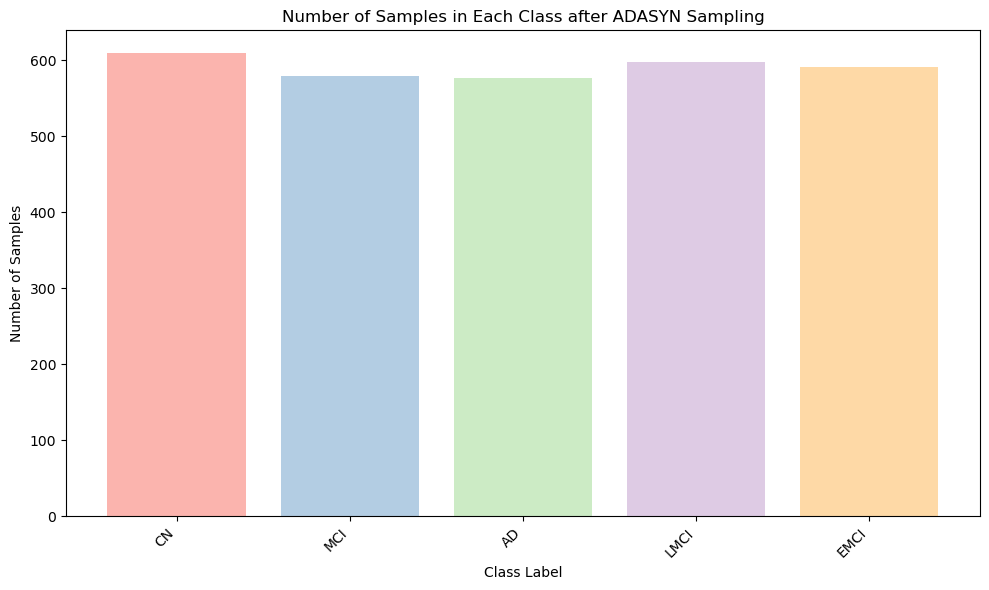

In [97]:
class_mapping = {
    0: 'CN',
    1: 'MCI',
    2: 'AD',
    3: 'LMCI',
    4: 'EMCI'
}
train_labels_flat = train_labels.argmax(axis=1)
class_names_resampled = [class_mapping[label] for label in train_labels_flat]
class_counts_resampled = Counter(class_names_resampled)

plt.figure(figsize=(10, 6))
colors = plt.cm.Pastel1.colors 
class_labels = list(class_counts_resampled.keys())
class_counts_values = list(class_counts_resampled.values())
plt.bar(class_labels, class_counts_values, color=colors)
plt.title('Number of Samples in Each Class after ADASYN Sampling')
plt.xlabel('Class Label')
plt.ylabel('Number of Samples')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [11]:
X_train, X_test1, y_train, y_test1 = train_test_split(train_data,train_labels, test_size=0.3, random_state=101,shuffle=True,stratify=train_labels)
X_val, X_test, y_val, y_test = train_test_split(X_test1,y_test1, test_size=0.5, random_state=101,shuffle=True,stratify=y_test1)
print('X_train shape is ' , X_train.shape)
print('X_test shape is ' , X_test.shape)
print('X_val shape is ' , X_val.shape)
print('y_train shape is ' , y_train.shape)
print('y_test shape is ' , y_test.shape)
print('y_val shape is ' , y_val.shape)

X_train shape is  (2068, 256, 256, 3)
X_test shape is  (444, 256, 256, 3)
X_val shape is  (443, 256, 256, 3)
y_train shape is  (2068, 5)
y_test shape is  (444, 5)
y_val shape is  (443, 5)


In [120]:
X_train = np.expand_dims(X_train, axis=1)
X_val = np.expand_dims(X_val, axis=1)
print(X_train.shape) 
print(X_val.shape)  

(2030, 1, 256, 256, 3)
(435, 1, 256, 256, 3)


In [121]:
X_test = np.expand_dims(X_test, axis=1)
print(X_test.shape) 

(435, 1, 256, 256, 3)


In [11]:
from tensorflow.keras.layers import LeakyReLU

In [46]:
def create_model(alpha=0.1):
    model = Sequential()
    model.add(Conv2D(filters=32, kernel_size=2, padding='same', input_shape=(256, 256, 3)))
    model.add(LeakyReLU(alpha=alpha))
    model.add(BatchNormalization())
    model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
    model.add(Dropout(0.25))
    model.add(Conv2D(filters=64, kernel_size=2, padding='same'))
    model.add(LeakyReLU(alpha=alpha))
    model.add(Conv2D(filters=64, kernel_size=2, padding='same'))
    model.add(LeakyReLU(alpha=alpha))
    model.add(BatchNormalization())
    model.add(MaxPool2D(pool_size=(2, 2), strides=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Conv2D(filters=128, kernel_size=2, padding='same'))
    model.add(LeakyReLU(alpha=alpha))
    model.add(Conv2D(filters=128, kernel_size=2, padding='same'))
    model.add(LeakyReLU(alpha=alpha))
    model.add(BatchNormalization())
    model.add(MaxPool2D(pool_size=(2, 2), strides=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(BatchNormalization())
    model.add(Dense(512))
    model.add(LeakyReLU(alpha=alpha))
    model.add(BatchNormalization())
    model.add(Dropout(0.25))
    model.add(Dense(256))
    model.add(LeakyReLU(alpha=alpha))
    model.add(BatchNormalization())
    model.add(Dropout(0.25))
    model.add(Dense(128))
    model.add(LeakyReLU(alpha=alpha))
    model.add(BatchNormalization())
    model.add(Dropout(0.25))
    model.add(Dense(64))
    model.add(LeakyReLU(alpha=alpha))
    model.add(BatchNormalization())
    model.add(Dropout(0.25))
    model.add(BatchNormalization())
    model.add(Dense(5, activation='softmax'))
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=Metrics)
    return model

model = create_model()


In [47]:
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 256, 256, 32)      416       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 256, 256, 32)      0         
                                                                 
 batch_normalization (Batch  (None, 256, 256, 32)      128       
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 128, 128, 32)      0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 128, 128, 32)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 64)      8

In [63]:
checkpoint_cb = ModelCheckpoint("cnn_adni.keras", save_best_only=True)
METRICS = [tf.keras.metrics.CategoricalAccuracy(name='acc'),
           tf.keras.metrics.AUC(name='auc')]
model.compile(optimizer ='adam', loss='categorical_crossentropy', metrics=METRICS)
hist = model.fit(X_train,y_train, epochs=50, validation_data=(X_val,y_val), callbacks=[checkpoint_cb])

Epoch 1/50
64/64 [==============================] - 192s 3s/step - loss: 0.1181 - acc: 0.9631 - auc: 0.9972 - val_loss: 0.7663 - val_acc: 0.8069 - val_auc: 0.9425
Epoch 2/50
64/64 [==============================] - 148s 2s/step - loss: 0.1286 - acc: 0.9557 - auc: 0.9968 - val_loss: 0.7589 - val_acc: 0.8115 - val_auc: 0.9526
Epoch 3/50
64/64 [==============================] - 139s 2s/step - loss: 0.1489 - acc: 0.9581 - auc: 0.9949 - val_loss: 0.7723 - val_acc: 0.7862 - val_auc: 0.9479
Epoch 4/50
64/64 [==============================] - 145s 2s/step - loss: 0.0895 - acc: 0.9680 - auc: 0.9984 - val_loss: 0.4671 - val_acc: 0.8851 - val_auc: 0.9734
Epoch 5/50
64/64 [==============================] - 143s 2s/step - loss: 0.0738 - acc: 0.9798 - auc: 0.9984 - val_loss: 0.4219 - val_acc: 0.8920 - val_auc: 0.9752
Epoch 6/50
64/64 [==============================] - 139s 2s/step - loss: 0.0521 - acc: 0.9818 - auc: 0.9994 - val_loss: 0.8185 - val_acc: 0.7816 - val_auc: 0.9474
Epoch 7/50
64/64 [====

In [64]:
model.save('CNN_adni.keras')
import pickle
with open('cnn_history.pkl', 'wb') as file:
    pickle.dump(hist.history, file)

#history_df = pd.DataFrame(history.history)
#history_df.to_csv('cnntraining_history.csv', index=False)
#with open('cnntraining_history.pkl', 'rb') as file:
    #history = pickle.load(file)

#history_df = pd.read_csv('cnntraining_history.csv')

# Convert the DataFrame back to a dictionary
#history = history_df.to_dict(orient='list')

In [117]:
with open('cnn_history.pkl', 'rb') as file:
    history = pickle.load(file)

In [22]:
model = tf.keras.models.load_model('cnn_adni.keras')

In [60]:
def accuracy_loss_plot (hist):
    fig = plt.figure(figsize=(15,10))
    
    plt.subplot(221)
    plt.plot(hist.history['acc'], 'bo--', label="accuracy")
    plt.plot(hist.history['val_acc'], 'ro--', label="val_accuracy")
    plt.title("Model Accuracy")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.grid()
    plt.legend()
    
    plt.subplot(222)
    plt.plot(hist.history['loss'], "bo--", label="loss")
    plt.plot(hist.history['val_loss'], "ro--", label = "val_loss")
    plt.title("Model Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.grid()
    plt.legend()
    
    plt.subplot(223)
    plt.plot(hist.history['auc'], "bo--", label="auc")
    plt.plot(hist.history['val_auc'], "ro--", label = "val_auc")
    plt.title("Model AUC")
    plt.xlabel("Epochs")
    plt.ylabel("AUC")
    plt.grid()
    plt.legend()
    
    plt.show()

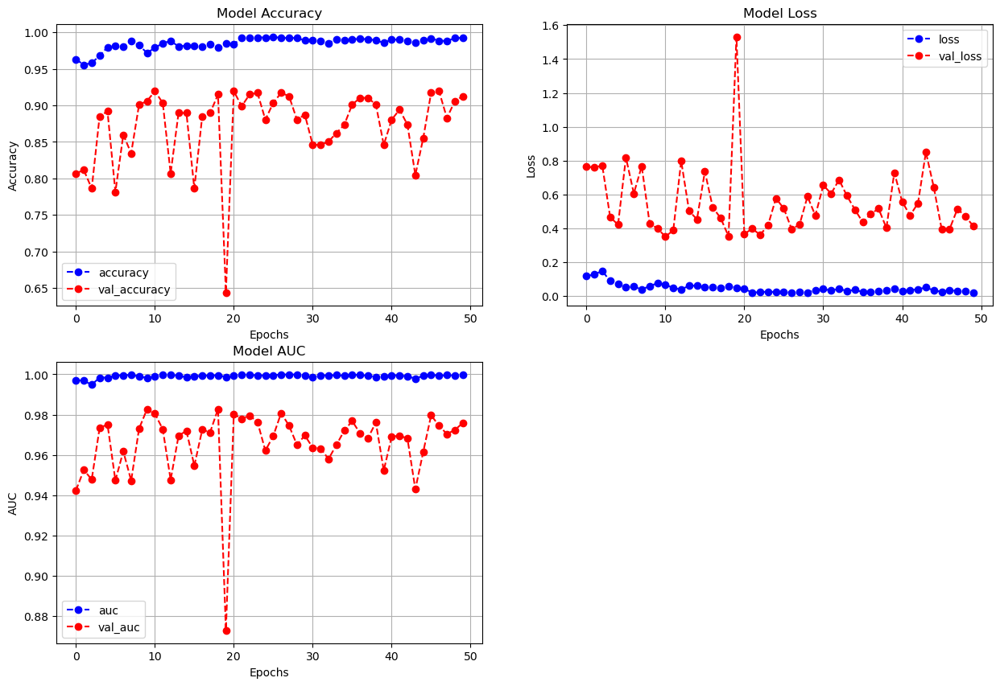

In [66]:
accuracy_loss_plot(hist)

In [46]:
test_data_gen = work_dr.flow_from_dataframe(df,x_col='image',y_col='label', target_size=Size, batch_size=500, shuffle=False)
X_test, y_test = test_data_gen.next()

Found 1296 validated image filenames belonging to 5 classes.


In [47]:
X_test.shape

(500, 256, 256, 3)

In [24]:
score, acc,auc= model.evaluate(X_test,y_test)
print('Test Loss =', score)
print('Test Accuracy =', acc)
print('Test Auc =', auc)


16/16 [==============================] - 11s 509ms/step - loss: 0.2701 - acc: 0.9440 - auc: 0.9842
Test Loss = 0.2700635492801666
Test Accuracy = 0.9440000057220459
Test Auc = 0.9842256307601929


In [49]:
y_pred = model.predict(X_test)

16/16 [==============================] - 8s 509ms/step


In [50]:
def roundoff(arr):
    arr[np.argwhere(arr != arr.max())] = 0
    arr[np.argwhere(arr == arr.max())] = 1
    return arr

for labels in y_pred:
    labels = roundoff(labels)

In [74]:
classes = ['AD','CN', 'EMCI', 'LMCI', 'MCI']

In [51]:
print(classification_report(y_test, y_pred, target_names=classes,zero_division=1))

              precision    recall  f1-score   support

          AD       0.99      0.92      0.96       171
          CN       0.93      0.98      0.95       247
        EMCI       0.81      0.83      0.82        36
        LMCI       1.00      0.91      0.95        11
         MCI       0.97      0.91      0.94        35

   micro avg       0.94      0.94      0.94       500
   macro avg       0.94      0.91      0.93       500
weighted avg       0.95      0.94      0.94       500
 samples avg       0.94      0.94      1.00       500



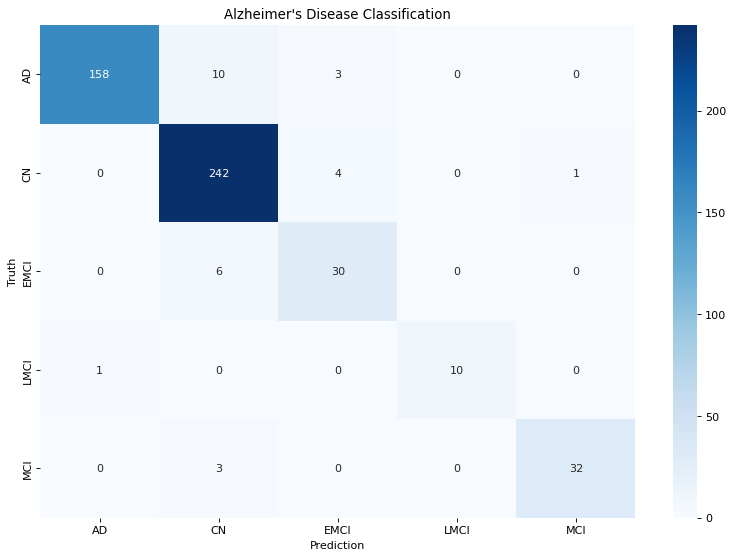

In [52]:
pred_ls = np.argmax(y_pred, axis=1)
test_ls = np.argmax(y_test, axis=1)

conf_arr = confusion_matrix(test_ls, pred_ls)
plt.figure(figsize=(12, 8), dpi=80, facecolor='w', edgecolor='k')

ax = sns.heatmap(conf_arr, cmap='Blues', annot=True, fmt='d', xticklabels=classes, yticklabels=classes)

plt.title('Alzheimer\'s Disease Classification')
plt.xlabel('Prediction')
plt.ylabel('Truth')
plt.show(ax)

# LSTM 

In [53]:
tf.keras.backend.clear_session()

In [54]:
Metrics = [tf.keras.metrics.CategoricalAccuracy(name='acc'),
           tf.keras.metrics.AUC(name='auc')]

def create_hybridmodel(alpha=0.1):
    model = Sequential()
    model.add(TimeDistributed(Conv2D(filters=32, kernel_size=2, padding='same'), input_shape=(1, 256, 256, 3)))
    model.add(TimeDistributed(LeakyReLU(alpha=alpha)))
    model.add(TimeDistributed(Conv2D(filters=32, kernel_size=2, padding='same')))
    model.add(TimeDistributed(LeakyReLU(alpha=alpha)))
    model.add(TimeDistributed(BatchNormalization()))
    model.add(TimeDistributed(MaxPool2D(pool_size=(2, 2), strides=(2, 2))))
    model.add(TimeDistributed(Dropout(0.25)))
    model.add(TimeDistributed(Conv2D(filters=64, kernel_size=2, padding='same')))
    model.add(TimeDistributed(LeakyReLU(alpha=alpha)))
    model.add(TimeDistributed(Conv2D(filters=64, kernel_size=2, padding='same')))
    model.add(TimeDistributed(LeakyReLU(alpha=alpha)))
    model.add(TimeDistributed(BatchNormalization()))
    model.add(TimeDistributed(MaxPool2D(pool_size=(2, 2), strides=(2, 2))))
    model.add(TimeDistributed(Dropout(0.25)))
    model.add(TimeDistributed(Conv2D(filters=128, kernel_size=2, padding='same')))
    model.add(TimeDistributed(LeakyReLU(alpha=alpha)))
    model.add(TimeDistributed(Conv2D(filters=128, kernel_size=2, padding='same')))
    model.add(TimeDistributed(LeakyReLU(alpha=alpha)))
    model.add(TimeDistributed(BatchNormalization()))
    model.add(TimeDistributed(MaxPool2D(pool_size=(2, 2), strides=(2, 2))))
    model.add(TimeDistributed(Dropout(0.25)))
    model.add(TimeDistributed(Flatten()))
    model.add(TimeDistributed(BatchNormalization()))
    model.add(TimeDistributed(Dense(512)))
    model.add(TimeDistributed(LeakyReLU(alpha=alpha)))
    model.add(TimeDistributed(BatchNormalization()))
    model.add(TimeDistributed(Dropout(0.25)))
    model.add(TimeDistributed(Dense(256)))
    model.add(TimeDistributed(LeakyReLU(alpha=alpha)))
    model.add(TimeDistributed(BatchNormalization()))
    model.add(TimeDistributed(Dropout(0.25)))
    model.add(TimeDistributed(Dense(128)))
    model.add(TimeDistributed(LeakyReLU(alpha=alpha)))
    model.add(TimeDistributed(BatchNormalization()))
    model.add(TimeDistributed(Dropout(0.25)))
    model.add(TimeDistributed(BatchNormalization()))
    model.add(LSTM(128, return_sequences=True,dropout=0.5))  
    model.add(LSTM(64, return_sequences=False))  
    model.add(Dense(5, activation='softmax'))  
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=Metrics)
    return model

model2 = create_hybridmodel()

In [55]:
print(model2.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDist  (None, 1, 256, 256, 32)   416       
 ributed)                                                        
                                                                 
 time_distributed_1 (TimeDi  (None, 1, 256, 256, 32)   0         
 stributed)                                                      
                                                                 
 time_distributed_2 (TimeDi  (None, 1, 256, 256, 32)   4128      
 stributed)                                                      
                                                                 
 time_distributed_3 (TimeDi  (None, 1, 256, 256, 32)   0         
 stributed)                                                      
                                                                 
 time_distributed_4 (TimeDi  (None, 1, 256, 256, 32)   1

In [56]:
checkpoint_cb = ModelCheckpoint("lstm_adni.keras", save_best_only=True)
history = model2.fit(X_train,y_train, epochs=50, validation_data=(X_val,y_val), callbacks=[checkpoint_cb])

Epoch 1/50
64/64 [==============================] - 182s 3s/step - loss: 1.5439 - acc: 0.3256 - auc: 0.6569 - val_loss: 1.9364 - val_acc: 0.2000 - val_auc: 0.5021
Epoch 2/50
64/64 [==============================] - 163s 3s/step - loss: 1.3118 - acc: 0.4562 - auc: 0.7739 - val_loss: 1.8346 - val_acc: 0.2345 - val_auc: 0.5469
Epoch 3/50
64/64 [==============================] - 158s 2s/step - loss: 1.0381 - acc: 0.5926 - auc: 0.8649 - val_loss: 2.6046 - val_acc: 0.2023 - val_auc: 0.5233
Epoch 4/50
64/64 [==============================] - 156s 2s/step - loss: 0.6862 - acc: 0.7527 - auc: 0.9419 - val_loss: 2.5749 - val_acc: 0.2023 - val_auc: 0.5671
Epoch 5/50
64/64 [==============================] - 155s 2s/step - loss: 0.5143 - acc: 0.8148 - auc: 0.9660 - val_loss: 2.6458 - val_acc: 0.2805 - val_auc: 0.5965
Epoch 6/50
64/64 [==============================] - 155s 2s/step - loss: 0.3479 - acc: 0.8828 - auc: 0.9836 - val_loss: 1.8525 - val_acc: 0.4598 - val_auc: 0.7454
Epoch 7/50
64/64 [====

In [58]:
model2.save('lstm_adni.keras')
#cnn_model = models.load_model('CNNModel.keras')
import pickle
with open('cnn_history.pkl', 'wb') as file:
    pickle.dump(history.history, file)

#history_df = pd.DataFrame(history.history)
#history_df.to_csv('cnntraining_history.csv', index=False)
#with open('cnntraining_history.pkl', 'rb') as file:
    #history = pickle.load(file)

#history_df = pd.read_csv('cnntraining_history.csv')

# Convert the DataFrame back to a dictionary
#history = history_df.to_dict(orient='list')

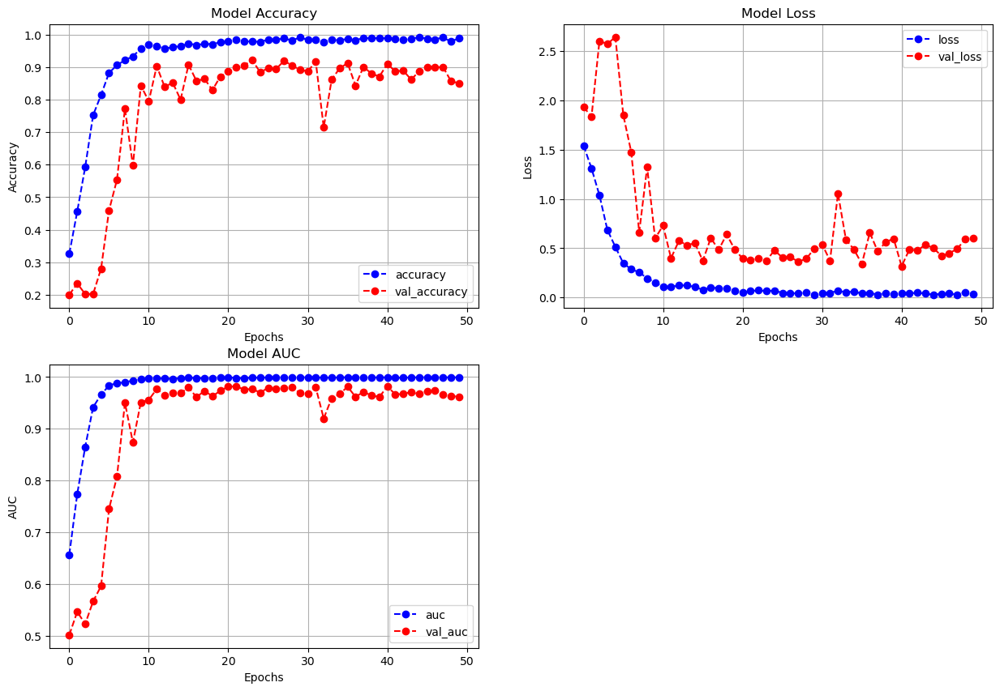

In [61]:
accuracy_loss_plot(history)

In [123]:
score, acc,auc= model2.evaluate(X_test,y_test)
print('Test Loss =', score)
print('Test Accuracy =', acc)
print('Test Auc =', auc)

14/14 [==============================] - 9s 606ms/step - loss: 0.5773 - acc: 0.8690 - auc: 0.9671
Test Loss = 0.5772947072982788
Test Accuracy = 0.8689655065536499
Test Auc = 0.9671481847763062


In [124]:
y_pred = model2.predict(X_test)

14/14 [==============================] - 13s 625ms/step


In [125]:
def roundoff(arr):
    arr[np.argwhere(arr != arr.max())] = 0
    arr[np.argwhere(arr == arr.max())] = 1
    return arr

for labels in y_pred:
    labels = roundoff(labels)

In [126]:
print(classification_report(y_test, y_pred, target_names=classes,zero_division=1))

              precision    recall  f1-score   support

          AD       0.84      0.93      0.89        87
          CN       0.83      0.60      0.69        87
        EMCI       0.87      0.83      0.85        87
        LMCI       0.98      1.00      0.99        87
         MCI       0.83      0.99      0.90        87

   micro avg       0.87      0.87      0.87       435
   macro avg       0.87      0.87      0.86       435
weighted avg       0.87      0.87      0.86       435
 samples avg       0.87      0.87      1.00       435



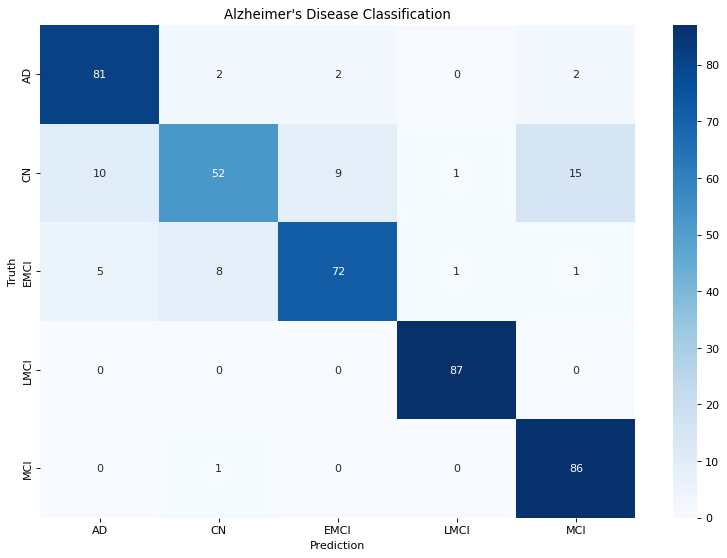

In [127]:
pred_ls = np.argmax(y_pred, axis=1)
test_ls = np.argmax(y_test, axis=1)

conf_arr = confusion_matrix(test_ls, pred_ls)
plt.figure(figsize=(12, 8), dpi=80, facecolor='w', edgecolor='k')

ax = sns.heatmap(conf_arr, cmap='Blues', annot=True, fmt='d', xticklabels=classes, yticklabels=classes)

plt.title('Alzheimer\'s Disease Classification')
plt.xlabel('Prediction')
plt.ylabel('Truth')
plt.show(ax)

# CNN1

In [26]:
tf.keras.backend.clear_session()

In [27]:
def create_model():
    model = Sequential()
    model.add(Conv2D(filters=16, kernel_size=2, activation='relu', padding='same', input_shape=(256, 256, 3)))
    model.add(MaxPool2D(pool_size=(2, 2), strides=(2, 2)))
    model.add(Conv2D(filters=64, kernel_size=3, activation='relu', padding='same'))
    model.add(MaxPool2D(pool_size=(2, 2), strides=(2, 2)))
    model.add(Conv2D(filters=256, kernel_size=5,activation='relu', padding='same'))
    model.add(MaxPool2D(pool_size=(2, 2), strides=(2, 2)))
    model.add(Dropout(0.25))
    model.add(BatchNormalization())
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dense(64, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dense(5, activation='softmax'))
    return model

model2 = create_model()
model2.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 256, 256, 16)      208       
                                                                 
 max_pooling2d (MaxPooling2  (None, 128, 128, 16)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 64)      9280      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 64, 64, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 256)       409856    
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 32, 32, 256)       0

In [28]:
checkpoint_cb = ModelCheckpoint("CNN2.keras", save_best_only=True)
METRICS = [tf.keras.metrics.CategoricalAccuracy(name='acc'),
           tf.keras.metrics.AUC(name='auc')]
model2.compile(optimizer ='adam', loss='categorical_crossentropy', metrics=METRICS)
hist = model2.fit(X_train,y_train, epochs=30, validation_data=(X_val,y_val), callbacks=[checkpoint_cb])


Epoch 1/30

65/65 [==============================] - 151s 2s/step - loss: 1.5176 - acc: 0.3598 - auc: 0.6749 - val_loss: 5.5655 - val_acc: 0.2190 - val_auc: 0.5012
Epoch 2/30
65/65 [==============================] - 142s 2s/step - loss: 1.1634 - acc: 0.5537 - auc: 0.8294 - val_loss: 4.0743 - val_acc: 0.2370 - val_auc: 0.5298
Epoch 3/30
65/65 [==============================] - 144s 2s/step - loss: 0.7545 - acc: 0.7466 - auc: 0.9321 - val_loss: 3.8830 - val_acc: 0.1986 - val_auc: 0.5315
Epoch 4/30
65/65 [==============================] - 143s 2s/step - loss: 0.7020 - acc: 0.7650 - auc: 0.9463 - val_loss: 3.5289 - val_acc: 0.3273 - val_auc: 0.5877
Epoch 5/30
65/65 [==============================] - 145s 2s/step - loss: 0.3826 - acc: 0.8849 - auc: 0.9831 - val_loss: 1.8031 - val_acc: 0.3860 - val_auc: 0.7145
Epoch 6/30
65/65 [==============================] - 142s 2s/step - loss: 0.2257 - acc: 0.9342 - auc: 0.9956 - val_loss: 1.1133 - val_acc: 0.4966 - val_auc: 0.8395
Epoch 7/30
65/65 [==

In [60]:

import pickle
with open('CNN2_history.pkl', 'wb') as file:
    pickle.dump(hist.history, file)

#history_df = pd.DataFrame(history.history)
#history_df.to_csv('cnntraining_history.csv', index=False)
#with open('cnntraining_history.pkl', 'rb') as file:
    #history = pickle.load(file)

#history_df = pd.read_csv('cnntraining_history.csv')

# Convert the DataFrame back to a dictionary
#history = history_df.to_dict(orient='list')

In [113]:
def accuracy_loss_plot (loss,val_loss,accuracy,val_accuracy,aucc,val_auc):
    fig = plt.figure(figsize=(15,10))
    
    plt.subplot(221)
    plt.plot(accuracy, marker="v",linestyle="--",color="r", label="accuracy")
    plt.plot(val_accuracy, marker="v",linestyle="--", color="b",label="val_accuracy")
    plt.title("Model Accuracy")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.grid()
    plt.legend()
    
    plt.subplot(222)
    plt.plot(loss, marker="v",linestyle="--", color="r",label="loss")
    plt.plot(val_loss, marker="v",linestyle="--", color="b",label = "val_loss")
    plt.title("Model Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.grid()
    plt.legend()
    
    plt.subplot(223)
    plt.plot(aucc, marker="v",linestyle="--", color="r",label="auc")
    plt.plot(val_auc,marker="v",linestyle="--", color="b",label = "val_auc")
    plt.title("Model AUC")
    plt.xlabel("Epochs")
    plt.ylabel("AUC")
    plt.grid()
    plt.legend()
    
    plt.show()

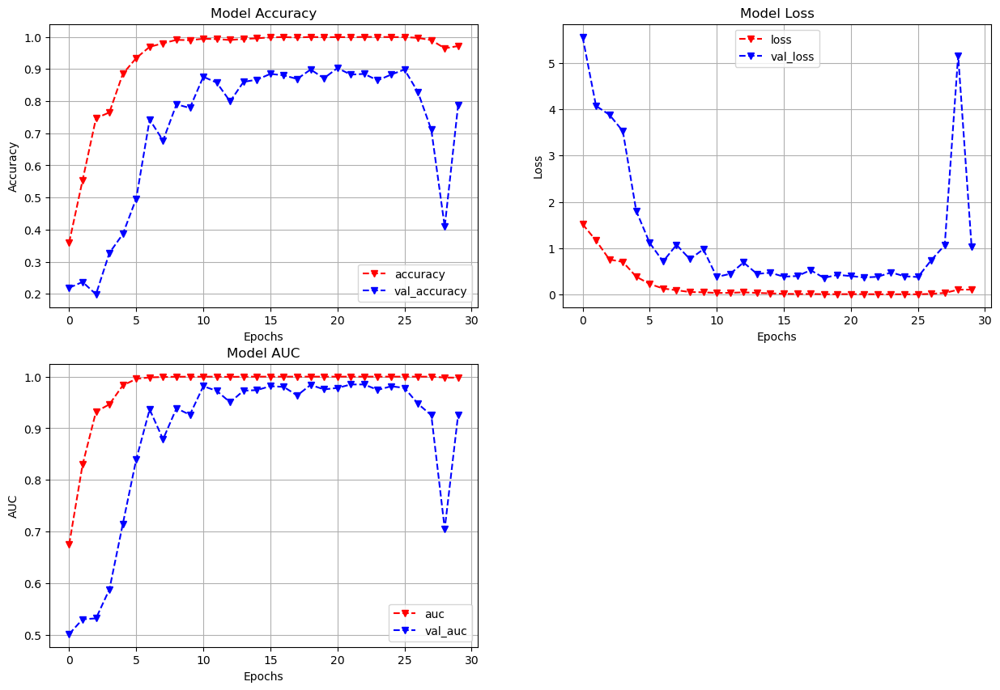

In [114]:
accuracy_loss_plot(loss,val_loss,accuracy,val_accuracy,aucc,val_auc)

In [99]:
import pickle
with open('CNN2_history.pkl', 'rb') as f:
    th = pickle.load(f)

In [101]:
loss = th['loss']
accuracy = th['acc']
val_loss = th['val_loss']
val_accuracy = th['val_acc']
aucc = th['auc']
val_auc = th['val_auc']
epochs = 30

In [104]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(
    go.Scatter( y=val_loss, name="val_loss"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter( y=loss, name="loss"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter( y=val_accuracy, name="val accuracy"),
    secondary_y=True,
)

fig.add_trace(
    go.Scatter( y=accuracy, name="accuracy"),
    secondary_y=True,
)

fig.update_layout(
    title_text="Loss/Accuracy of CNN1 Model"
)

fig.update_xaxes(title_text="Epoch")

fig.update_yaxes(title_text="<b>Primary</b> Loss", secondary_y=False)
fig.update_yaxes(title_text="<b>Secondary</b> Accuracy", secondary_y=True)

fig.show()

In [11]:
test_data_gen = work_dr.flow_from_dataframe(df,x_col='image',y_col='label', target_size=Size, batch_size=196, shuffle=False)
X_test, y_test = test_data_gen.next()
X_test.shape

Found 1296 validated image filenames belonging to 5 classes.


(196, 256, 256, 3)

In [12]:
test_data_flat = X_test.reshape(-1, 256 * 256 * 3)

adasyn = ADASYN(sampling_strategy='auto', n_neighbors=3, random_state=42)

X_test, y_test = adasyn.fit_resample(test_data_flat, y_test)
X_test = X_test.reshape(-1, 256, 256, 3)

print("Shape of train_data_resampled:", X_test.shape)
print("Shape of train_labels_resampled:", y_test.shape)

Shape of train_data_resampled: (450, 256, 256, 3)
Shape of train_labels_resampled: (450, 5)


In [141]:
score, acc,auc= model1.evaluate(X_train,y_train)
print('Test Loss =', score)
print('Test Accuracy =', acc)
print('Test Auc =', auc)

65/65 [==============================] - 55s 829ms/step - loss: 0.0034 - acc: 0.9995 - auc: 1.0000
Test Loss = 0.003406750736758113
Test Accuracy = 0.9995164275169373
Test Auc = 0.9999979138374329


In [16]:
score, acc,auc= model1.evaluate(X_test,y_test)
print('Test Loss =', score)
print('Test Accuracy =', acc)
print('Test Auc =', auc)

15/15 [==============================] - 12s 796ms/step - loss: 0.0730 - acc: 0.9800 - auc: 0.9984
Test Loss = 0.07296797633171082
Test Accuracy = 0.9800000190734863
Test Auc = 0.9983512163162231


In [13]:
y_predx = model1.predict(X_test) 
def roundoff(arr):
    arr[np.argwhere(arr != arr.max())] = 0
    arr[np.argwhere(arr == arr.max())] = 1
    return arr

for labels in y_predx:
    labels = roundoff(labels)

15/15 [==============================] - 9s 551ms/step


In [24]:
print(classification_report(y_test, y_predx, target_names=classes,zero_division=1))

              precision    recall  f1-score   support

          AD       0.99      0.97      0.98        94
          CN       0.97      0.97      0.97        87
        EMCI       0.99      0.97      0.98        95
        LMCI       0.97      1.00      0.98        84
         MCI       0.99      1.00      0.99        90

   micro avg       0.98      0.98      0.98       450
   macro avg       0.98      0.98      0.98       450
weighted avg       0.98      0.98      0.98       450
 samples avg       0.98      0.98      1.00       450



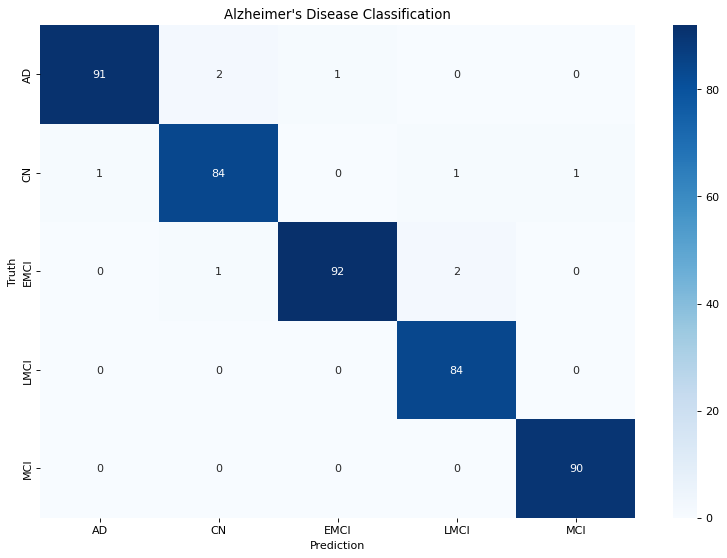

In [25]:
pred_ls = np.argmax(y_predx, axis=1)
test_ls = np.argmax(y_test, axis=1)

conf_arr = confusion_matrix(test_ls, pred_ls)
plt.figure(figsize=(12, 8), dpi=80, facecolor='w', edgecolor='k')

ax = sns.heatmap(conf_arr, cmap='Blues', annot=True, fmt='d', xticklabels=classes, yticklabels=classes)

plt.title('Alzheimer\'s Disease Classification')
plt.xlabel('Prediction')
plt.ylabel('Truth')
plt.show(ax)

In [69]:
from sklearn.metrics import roc_curve,auc
from sklearn.metrics import RocCurveDisplay
from itertools import cycle
y_true = np.argmax(y_test, axis=1)

In [16]:
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(5):  
    fpr[i], tpr[i], _ = roc_curve(y_true == i, y_predx[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

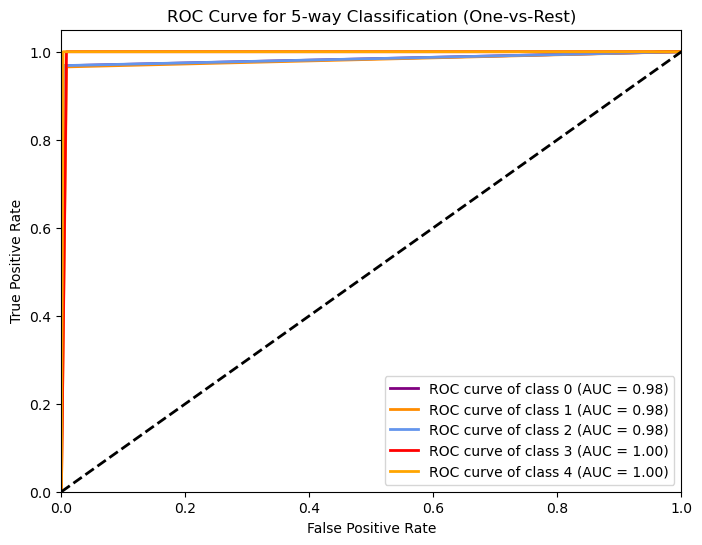

In [21]:
fig, ax = plt.subplots(figsize=(8,6))

colors = cycle(["purple", "darkorange", "cornflowerblue","red","orange"])
for i, color in zip(range(5), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (AUC = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for 5-way Classification (One-vs-Rest)')
plt.legend(loc="lower right")
plt.show()

In [35]:
converter = tf.lite.TFLiteConverter.from_keras_model(model1)
tflite_model = converter.convert()

with open("cnnmodel1.tflite", 'wb') as f:
  f.write(tflite_model)

INFO:tensorflow:Assets written to: C:\Users\Bhumi\AppData\Local\Temp\tmpuzfdrbyu\assets


INFO:tensorflow:Assets written to: C:\Users\Bhumi\AppData\Local\Temp\tmpuzfdrbyu\assets


In [30]:
label_names = {i: label for i, label in enumerate(labels)}
label_names = {
    0: 'AD',
    1: 'CN',
    2: 'EMCI',
    3: 'LMCI',
    4: 'MCI',
}

In [34]:
# plt.figure(figsize=(20,10))
# for i, (image_path, label) in enumerate(zip(images[:300], labels[:300])):
   
#     image = cv2.imread(image_path)
    
#     image = cv2.resize(image, (256, 256))
#     prediction = model1.predict(image.reshape(1, *image.shape))[0] 
#     predicted_label = label_names.get(prediction.argmax(), 'Unknown')
    
#     plt.subplot(20, 15, i+1)
#     plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)) 
#     plt.title(f'Label: {label}, Prediction: {predicted_label}')
#     plt.axis('off')

# plt.show()

# CNN2

In [12]:
tf.keras.backend.clear_session()

In [13]:
def create_model(alpha=0.1):
    model = Sequential()
    model.add(Conv2D(filters=32, kernel_size=2, padding='same', input_shape=(256, 256, 3), name='cnn2_conv2d_input'))
    model.add(LeakyReLU(alpha=alpha, name='cnn2_leaky_relu_1'))
    model.add(MaxPool2D(pool_size=(2, 2), strides=(2, 2), name='cnn2_max_pooling2d_1'))
    model.add(Conv2D(filters=32, kernel_size=2, padding='same', name='cnn2_conv2d_1'))
    model.add(LeakyReLU(alpha=alpha, name='cnn2_leaky_relu_2'))
    model.add(MaxPool2D(pool_size=(2, 2), strides=(2, 2), name='cnn2_max_pooling2d_2'))
    model.add(Conv2D(filters=128, kernel_size=3, padding='same', name='cnn2_conv2d_2'))
    model.add(LeakyReLU(alpha=alpha, name='cnn2_leaky_relu_3'))
    model.add(MaxPool2D(pool_size=(2, 2), strides=(2, 2), name='cnn2_max_pooling2d_3'))
    model.add(Conv2D(filters=512, kernel_size=5, padding='same', name='cnn2_conv2d_3'))
    model.add(LeakyReLU(alpha=alpha, name='cnn2_leaky_relu_4'))
    model.add(MaxPool2D(pool_size=(2, 2), strides=(2, 2), name='cnn2_max_pooling2d_4'))
    model.add(Dropout(0.25, name='cnn2_dropout'))
    model.add(BatchNormalization(name='cnn2_batch_normalization'))
    model.add(Flatten(name='cnn2_flatten'))
    model.add(Dense(128, name='cnn2_dense_1'))
    model.add(LeakyReLU(alpha=alpha, name='cnn2_leaky_relu_5'))
    model.add(Dense(64, name='cnn2_dense_2'))
    model.add(LeakyReLU(alpha=alpha, name='cnn2_leaky_relu_6'))
    model.add(BatchNormalization(name='cnn2_batch_normalization_2'))
    model.add(Dense(5, activation='softmax', name='cnn2_output'))
    return model

model3 = create_model()
model3.summary()



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 cnn2_conv2d_input (Conv2D)  (None, 256, 256, 32)      416       
                                                                 
 cnn2_leaky_relu_1 (LeakyRe  (None, 256, 256, 32)      0         
 LU)                                                             
                                                                 
 cnn2_max_pooling2d_1 (MaxP  (None, 128, 128, 32)      0         
 ooling2D)                                                       
                                                                 
 cnn2_conv2d_1 (Conv2D)      (None, 128, 128, 32)      4128      
                                                                 
 cnn2_leaky_relu_2 (LeakyRe  (None, 128, 128, 32)      0         
 LU)                                                             
                                                       

In [14]:
checkpoint_cb = ModelCheckpoint("CNN_3.keras", save_best_only=True)
METRICS = [tf.keras.metrics.CategoricalAccuracy(name='acc'),
           tf.keras.metrics.AUC(name='auc')]
model3.compile(optimizer ='adam', loss='categorical_crossentropy', metrics=METRICS)
history = model3.fit(X_train,y_train, epochs=30, validation_data=(X_val,y_val), callbacks=[checkpoint_cb])


Epoch 1/30

65/65 [==============================] - 220s 3s/step - loss: 1.5893 - acc: 0.3549 - auc: 0.6443 - val_loss: 2.2157 - val_acc: 0.2235 - val_auc: 0.5293
Epoch 2/30
65/65 [==============================] - 199s 3s/step - loss: 1.3228 - acc: 0.4782 - auc: 0.7683 - val_loss: 2.7613 - val_acc: 0.2460 - val_auc: 0.5430
Epoch 3/30
65/65 [==============================] - 200s 3s/step - loss: 1.0823 - acc: 0.5870 - auc: 0.8519 - val_loss: 2.4329 - val_acc: 0.2325 - val_auc: 0.5683
Epoch 4/30
65/65 [==============================] - 201s 3s/step - loss: 0.8269 - acc: 0.6920 - auc: 0.9145 - val_loss: 1.9973 - val_acc: 0.4221 - val_auc: 0.6922
Epoch 5/30
65/65 [==============================] - 201s 3s/step - loss: 0.5158 - acc: 0.8191 - auc: 0.9657 - val_loss: 1.4498 - val_acc: 0.4244 - val_auc: 0.7501
Epoch 6/30
65/65 [==============================] - 199s 3s/step - loss: 0.3115 - acc: 0.8926 - auc: 0.9869 - val_loss: 1.0131 - val_acc: 0.6163 - val_auc: 0.8728
Epoch 7/30
65/65 [==

In [24]:
import pickle
with open('CNN3_history.pkl', 'wb') as file:
    pickle.dump(history.history, file)

#history_df = pd.DataFrame(history.history)
#history_df.to_csv('cnntraining_history.csv', index=False)
#with open('cnntraining_history.pkl', 'rb') as file:
    #history = pickle.load(file)

#history_df = pd.read_csv('cnntraining_history.csv')

# Convert the DataFrame back to a dictionary
#history = history_df.to_dict(orient='list')

In [115]:
with open('CNN3_history.pkl', 'rb') as f:
    th2 = pickle.load(f)

In [121]:
loss = th2['loss']
accuracy = th2['acc']
val_loss = th2['val_loss']
val_accuracy = th2['val_acc']
aucc = th2['auc']
val_auc = th2['val_auc']
epochs = 30

In [122]:
def accuracy_loss_plot (loss,val_loss,accuracy,val_accuracy,aucc,val_auc):
    fig = plt.figure(figsize=(15,10))
    
    plt.subplot(221)
    plt.plot(accuracy, marker="v",linestyle="--",color="r", label="accuracy")
    plt.plot(val_accuracy, marker="v",linestyle="--", color="b",label="val_accuracy")
    plt.title("Model Accuracy")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.grid()
    plt.legend()
    
    plt.subplot(222)
    plt.plot(loss, marker="v",linestyle="--", color="r",label="loss")
    plt.plot(val_loss, marker="v",linestyle="--", color="b",label = "val_loss")
    plt.title("Model Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.grid()
    plt.legend()
    
    plt.subplot(223)
    plt.plot(aucc, marker="v",linestyle="--", color="r",label="auc")
    plt.plot(val_auc,marker="v",linestyle="--", color="b",label = "val_auc")
    plt.title("Model AUC")
    plt.xlabel("Epochs")
    plt.ylabel("AUC")
    plt.grid()
    plt.legend()
    
    plt.show()

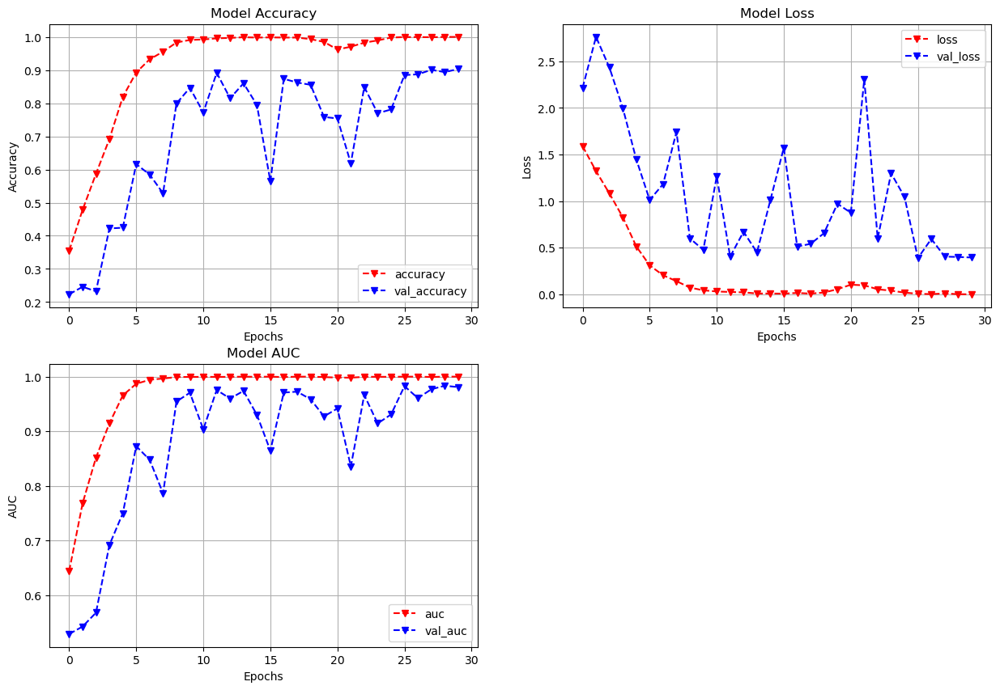

In [123]:
accuracy_loss_plot(loss,val_loss,accuracy,val_accuracy,aucc,val_auc)

In [124]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots


fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(
    go.Scatter( y=val_loss, name="val_loss"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter( y=loss, name="loss"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter( y=val_accuracy, name="val accuracy"),
    secondary_y=True,
)

fig.add_trace(
    go.Scatter( y=accuracy, name="accuracy"),
    secondary_y=True,
)

fig.update_layout(
    title_text="Loss/Accuracy of CNN2 Model"
)

fig.update_xaxes(title_text="Epoch")

fig.update_yaxes(title_text="<b>Primary</b> Loss", secondary_y=False)
fig.update_yaxes(title_text="<b>Secondary</b> Accuracy", secondary_y=True)

fig.show()

In [20]:
# test_data_gen = work_dr.flow_from_dataframe(df,x_col='image',y_col='label', target_size=Size, batch_size=296, shuffle=False)
# X_test, y_test = test_data_gen.next()
# X_test.shape

In [19]:
# test_data_flat = X_test.reshape(-1, 256 * 256 * 3)

# adasyn = ADASYN(sampling_strategy='auto', n_neighbors=3, random_state=42)

# X_test, y_test = adasyn.fit_resample(test_data_flat, y_test)
# X_test = X_test.reshape(-1, 256, 256, 3)

# print("Shape of train_data_resampled:", X_test.shape)
# print("Shape of train_labels_resampled:", y_test.shape)

In [26]:
score, acc,auc= model2.evaluate(X_test,y_test)
print('Test Loss =', score)
print('Test Accuracy =', acc)
print('Test Auc =', auc)

15/15 [==============================] - 13s 804ms/step - loss: 0.1411 - acc: 0.9711 - auc: 0.9944
Test Loss = 0.1411139965057373
Test Accuracy = 0.9711111187934875
Test Auc = 0.9943932294845581


In [22]:
y_pred = model2.predict(X_test) 
def roundoff(arr):
    arr[np.argwhere(arr != arr.max())] = 0
    arr[np.argwhere(arr == arr.max())] = 1
    return arr

for labels in y_pred:
    labels = roundoff(labels)

15/15 [==============================] - 9s 556ms/step


In [28]:
print(classification_report(y_test, y_pred, target_names=classes,zero_division=1))

              precision    recall  f1-score   support

          AD       0.98      0.97      0.97        94
          CN       0.99      0.93      0.96        87
        EMCI       0.96      0.96      0.96        95
        LMCI       1.00      1.00      1.00        84
         MCI       0.94      1.00      0.97        90

   micro avg       0.97      0.97      0.97       450
   macro avg       0.97      0.97      0.97       450
weighted avg       0.97      0.97      0.97       450
 samples avg       0.97      0.97      1.00       450



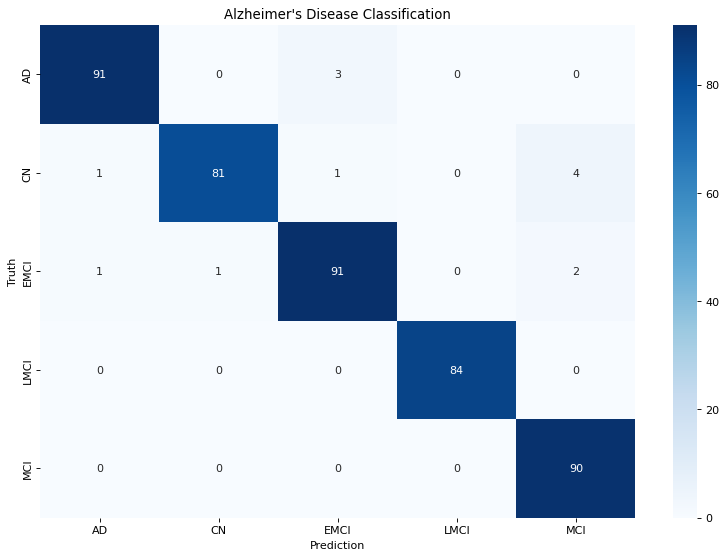

In [29]:
pred_ls = np.argmax(y_pred, axis=1)
test_ls = np.argmax(y_test, axis=1)

conf_arr = confusion_matrix(test_ls, pred_ls)
plt.figure(figsize=(12, 8), dpi=80, facecolor='w', edgecolor='k')

ax = sns.heatmap(conf_arr, cmap='Blues', annot=True, fmt='d', xticklabels=classes, yticklabels=classes)

plt.title('Alzheimer\'s Disease Classification')
plt.xlabel('Prediction')
plt.ylabel('Truth')
plt.show(ax)

In [23]:
y_true2 = np.argmax(y_test, axis=1)
fpr2 = dict()
tpr2 = dict()
roc_auc2 = dict()
for i in range(5):  
    fpr2[i], tpr2[i], _ = roc_curve(y_true2 == i, y_pred[:, i])
    roc_auc2[i] = auc(fpr2[i], tpr2[i])

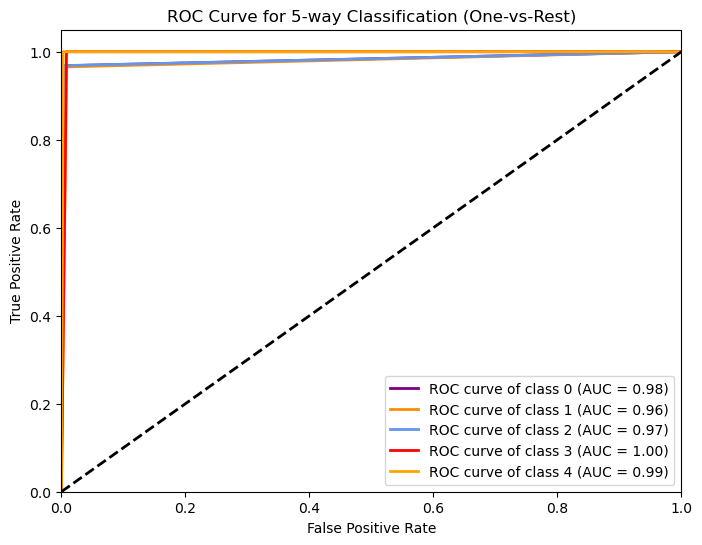

In [24]:
fig, ax = plt.subplots(figsize=(8,6))

colors = cycle(["purple", "darkorange", "cornflowerblue","red","orange"])
for i, color in zip(range(5), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (AUC = {1:0.2f})'
             ''.format(i, roc_auc2[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for 5-way Classification (One-vs-Rest)')
plt.legend(loc="lower right")
plt.show()

# CNN3

In [11]:
from keras.layers import Concatenate
from keras.models import Model
from keras.layers import Input


In [12]:
model1 = tf.keras.models.load_model('CNN2.keras')
model2 = tf.keras.models.load_model('CNN_3.keras')

In [30]:
print(model1.input)
print(model2.input)
print(model1.output)
print(model2.output)

KerasTensor(type_spec=TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name='conv2d_input'), name='conv2d_input', description="created by layer 'conv2d_input'")
KerasTensor(type_spec=TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name='cnn2_conv2d_input_input'), name='cnn2_conv2d_input_input', description="created by layer 'cnn2_conv2d_input_input'")
KerasTensor(type_spec=TensorSpec(shape=(None, 5), dtype=tf.float32, name=None), name='dense_2/Softmax:0', description="created by layer 'dense_2'")
KerasTensor(type_spec=TensorSpec(shape=(None, 5), dtype=tf.float32, name=None), name='cnn2_output/Softmax:0', description="created by layer 'cnn2_output'")


In [31]:
input_model1 = model1.input
input_model2 = model2.input

output_model1 = model1.layers[-1].output
output_model2 = model2.layers[-1].output

concatenated_output = Concatenate()([output_model1, output_model2])
final_output = Dense(5, activation='softmax', name='final_output')(concatenated_output)

combined_model = Model(inputs=[input_model1, input_model2], outputs=final_output)

METRICS = [tf.keras.metrics.CategoricalAccuracy(name='acc'),
           tf.keras.metrics.AUC(name='auc')]

combined_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=METRICS)

combined_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 cnn2_conv2d_input_input (I  [(None, 256, 256, 3)]        0         []                            
 nputLayer)                                                                                       
                                                                                                  
 cnn2_conv2d_input (Conv2D)  (None, 256, 256, 32)         416       ['cnn2_conv2d_input_input[0][0
                                                                    ]']                           
                                                                                                  
 cnn2_leaky_relu_1 (LeakyRe  (None, 256, 256, 32)         0         ['cnn2_conv2d_input[0][0]']   
 LU)                                                                                          

                                                                                                  
 cnn2_leaky_relu_6 (LeakyRe  (None, 64)                   0         ['cnn2_dense_2[0][0]']        
 LU)                                                                                              
                                                                                                  
 batch_normalization_1 (Bat  (None, 64)                   256       ['dense_1[0][0]']             
 chNormalization)                                                                                 
                                                                                                  
 cnn2_batch_normalization_2  (None, 64)                   256       ['cnn2_leaky_relu_6[0][0]']   
  (BatchNormalization)                                                                            
                                                                                                  
 dense_2 (

In [46]:
checkpoint_cb = ModelCheckpoint("Combinedcnn_3.keras", save_best_only=True)

METRICS = [tf.keras.metrics.CategoricalAccuracy(name='acc'),
           tf.keras.metrics.AUC(name='auc')]

combined_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=METRICS)
history = combined_model.fit([X_train,X_train],y_train, epochs=30, validation_data=([X_val,X_val],y_val), callbacks=[checkpoint_cb])

Epoch 1/30
65/65 [==============================] - 304s 4s/step - loss: 1.3454 - acc: 0.5392 - auc: 0.7806 - val_loss: 1.3074 - val_acc: 0.5192 - val_auc: 0.7949
Epoch 2/30
65/65 [==============================] - 264s 4s/step - loss: 0.9939 - acc: 0.8433 - auc: 0.9653 - val_loss: 1.4694 - val_acc: 0.3589 - val_auc: 0.6741
Epoch 3/30
65/65 [==============================] - 268s 4s/step - loss: 0.8151 - acc: 0.9386 - auc: 0.9916 - val_loss: 1.1639 - val_acc: 0.6591 - val_auc: 0.8217
Epoch 4/30
65/65 [==============================] - 474s 7s/step - loss: 0.6731 - acc: 0.9753 - auc: 0.9975 - val_loss: 0.8591 - val_acc: 0.8307 - val_auc: 0.9648
Epoch 5/30
65/65 [==============================] - 264s 4s/step - loss: 0.5596 - acc: 0.9865 - auc: 0.9991 - val_loss: 1.1633 - val_acc: 0.6117 - val_auc: 0.8213
Epoch 6/30
65/65 [==============================] - 268s 4s/step - loss: 0.4974 - acc: 0.9869 - auc: 0.9993 - val_loss: 0.8381 - val_acc: 0.8014 - val_auc: 0.9241
Epoch 7/30
65/65 [====

In [25]:
combined_model = tf.keras.models.load_model('Combinedcnn_3.keras')

In [62]:
test_data_gen = work_dr.flow_from_dataframe(df,x_col='image',y_col='label', target_size=Size, batch_size=191, shuffle=False)
X_test, y_test = test_data_gen.next()
X_test.shape

Found 1296 validated image filenames belonging to 5 classes.


(191, 256, 256, 3)

In [63]:
test_data_flat = X_test.reshape(-1, 256 * 256 * 3)

adasyn = ADASYN(sampling_strategy='all', n_neighbors=7, random_state=101)

X_test, y_test = adasyn.fit_resample(test_data_flat, y_test)
X_test = X_test.reshape(-1, 256, 256, 3)

print("Shape of train_data_resampled:", X_test.shape)
print("Shape of train_labels_resampled:", y_test.shape)

Shape of train_data_resampled: (438, 256, 256, 3)
Shape of train_labels_resampled: (438, 5)


In [64]:
score, acc,auc= combined_model.evaluate([X_test,X_test],y_test)
print('Test Loss =', score)
print('Test Accuracy =', acc)
print('Test Auc =', auc)

14/14 [==============================] - 15s 1s/step - loss: 0.1830 - acc: 0.9726 - auc: 0.9953
Test Loss = 0.18299826979637146
Test Accuracy = 0.9726027250289917
Test Auc = 0.9952571392059326


In [65]:
y_pred = combined_model.predict([X_test,X_test]) 
def roundoff(arr):
    arr[np.argwhere(arr != arr.max())] = 0
    arr[np.argwhere(arr == arr.max())] = 1
    return arr

for labels in y_pred:
    labels = roundoff(labels)

14/14 [==============================] - 16s 1s/step


In [76]:
print(classification_report(y_test, y_pred, target_names=classes,zero_division=1))

              precision    recall  f1-score   support

          AD       0.99      0.96      0.97        94
          CN       0.94      0.93      0.94        87
        EMCI       0.97      0.97      0.97        95
        LMCI       0.99      1.00      0.99        84
         MCI       0.97      1.00      0.98        90

   micro avg       0.97      0.97      0.97       450
   macro avg       0.97      0.97      0.97       450
weighted avg       0.97      0.97      0.97       450
 samples avg       0.97      0.97      1.00       450



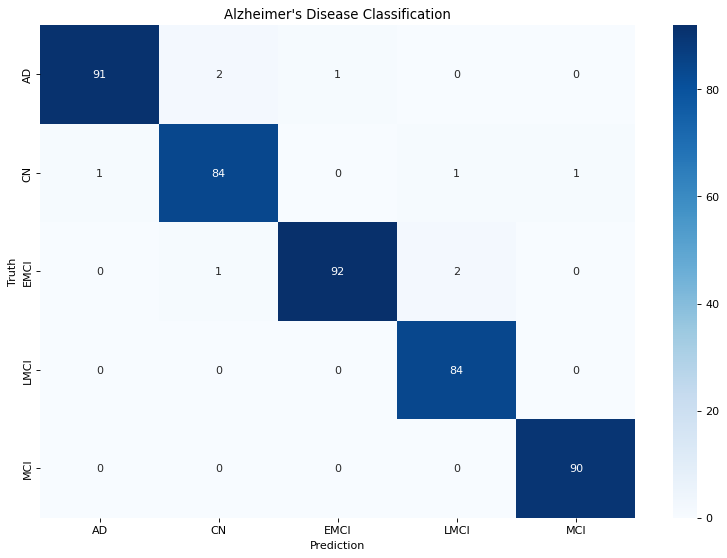

In [77]:
pred_ls = np.argmax(y_predx, axis=1)
test_ls = np.argmax(y_test, axis=1)

conf_arr = confusion_matrix(test_ls, pred_ls)
plt.figure(figsize=(12, 8), dpi=80, facecolor='w', edgecolor='k')

ax = sns.heatmap(conf_arr, cmap='Blues', annot=True, fmt='d', xticklabels=classes, yticklabels=classes)

plt.title('Alzheimer\'s Disease Classification')
plt.xlabel('Prediction')
plt.ylabel('Truth')
plt.show(ax)

In [70]:
y_true = np.argmax(y_test, axis=1)
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(5):  
    fpr[i], tpr[i], _ = roc_curve(y_true == i, y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

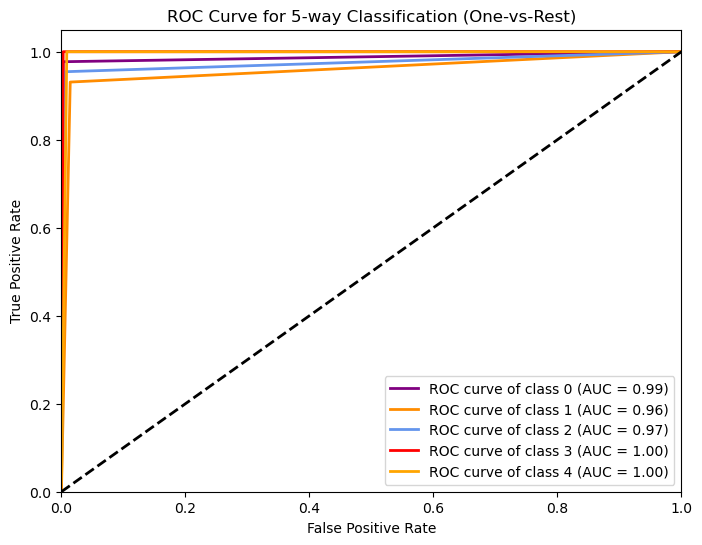

In [71]:
fig, ax = plt.subplots(figsize=(8,6))

colors = cycle(["purple", "darkorange", "cornflowerblue","red","orange"])
for i, color in zip(range(5), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (AUC = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for 5-way Classification (One-vs-Rest)')
plt.legend(loc="lower right")
plt.show()

# GRAD-CAM

In [132]:
from keras import backend as K

In [123]:
images1 = []
labels1 = []
for subfolder in tqdm(os.listdir('./Alzheimers-ADNI')):
    subfolder_path = os.path.join('./Alzheimers-ADNI', subfolder)
    for folder in os.listdir(subfolder_path):
        subfolder_path2=os.path.join(subfolder_path,folder)
        for image_filename in os.listdir(subfolder_path2):
            image_path = os.path.join(subfolder_path2, image_filename)
            img = cv2.imread(image_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = img/255
            img = cv2.resize(img, (256, 256))
            images1.append(img)
            labels1.append(folder.replace(' JPEG', ''))

100%|██████████| 2/2 [00:06<00:00,  3.42s/it]


In [164]:
class_mapping = {'Final AD': 0, 'Final CN': 1, 'Final EMCI': 2, 'Final LMCI': 3, 'Final MCI': 4}  
labels1 = [class_mapping[label] for label in labels]

In [165]:
images1 = np.array(images1)
labels1 = tf.keras.utils.to_categorical(labels1, num_classes = 5)
print(images1.shape)
print(labels1.shape)

(1296, 256, 256, 3)
(1296, 5)


In [167]:
indexs = np.random.choice(range(images1.shape[0]), size = (images1.shape[0], ))
images1 = images1[indexs]
labels1 = labels1[indexs]
images1.shape, labels1.shape

((1296, 256, 256, 3), (1296, 5))

In [181]:
def gradCam(image, true_label, layer_conv_name,model):
    model_grad = tf.keras.models.Model(inputs = model.input, 
                                  outputs = [model.get_layer(layer_conv_name).output, 
                                             model.output])
    with tf.GradientTape() as tape:
        conv_output, predictions = model_grad(image)
        tape.watch(conv_output)
        loss = tf.losses.categorical_crossentropy(true_label, predictions)
    grad = tape.gradient(loss, conv_output)
    grad = K.mean(tf.abs(grad), axis = (0, 1, 2))
    conv_output = np.squeeze(conv_output.numpy())
    for i in range(conv_output.shape[-1]):
        conv_output[:,:, i] = conv_output[:,:, i]*grad[i]
    heatmap = tf.reduce_mean(conv_output, axis = -1)
    heatmap = np.maximum(heatmap, 0)
    heatmap = heatmap/tf.reduce_max(heatmap)
    heatmap = cv2.resize(heatmap.numpy(), (256, 256))
    return np.squeeze(heatmap), np.squeeze(image)

In [182]:
def getHeatMap(images, labels,model,conv):
    heatmaps = []
    for index in range(196):
        heatmap, image = gradCam(images[index: index + 1], 
                                               labels[index: index + 1], conv, model)
        heatmaps.append(heatmap)
    return np.array(heatmaps)

In [183]:
heatmaps = getHeatMap(images1, labels1,model1,'conv2d_2')
heatmaps.shape

(196, 256, 256)

In [184]:
class_mapping = {0: 'AD', 1: 'CN', 2: 'EMCI', 3: 'LMCI',4: 'MCI',} 
def draw_compare(images, gradcam_heatmaps, labels,class_mapping):
  plt.figure(figsize = (20, 40))
  index = 0
  n = 0
  num_samples = min(len(images1), len(gradcam_heatmaps), len(labels1), 40)
  for i in range(num_samples):
    plt.subplot(10, 4, (i + 1))
    if index == 0:
      plt.imshow(images1[n])
      plt.title('Image-class: {}'.format(class_mapping[labels[n]]))
      index = 1
    elif index == 1:
      plt.imshow(images1[n])
      plt.imshow(gradcam_heatmaps[n], alpha = 0.6, cmap = 'jet')
      plt.title('Grad-Cam')
      index = 0
      n = n + 1
  plt.legend(['Image', 'Grad-Cam'])


In [171]:
l = np.argmax(labels1, axis = 1)
l.shape

(1296,)

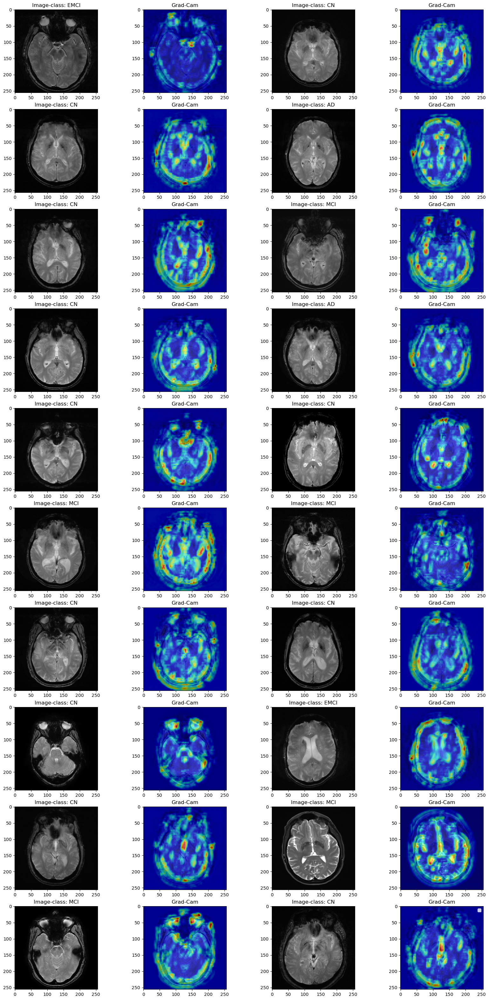

In [185]:
draw_compare(images[:40], heatmaps[:40], l[:40],class_mapping)

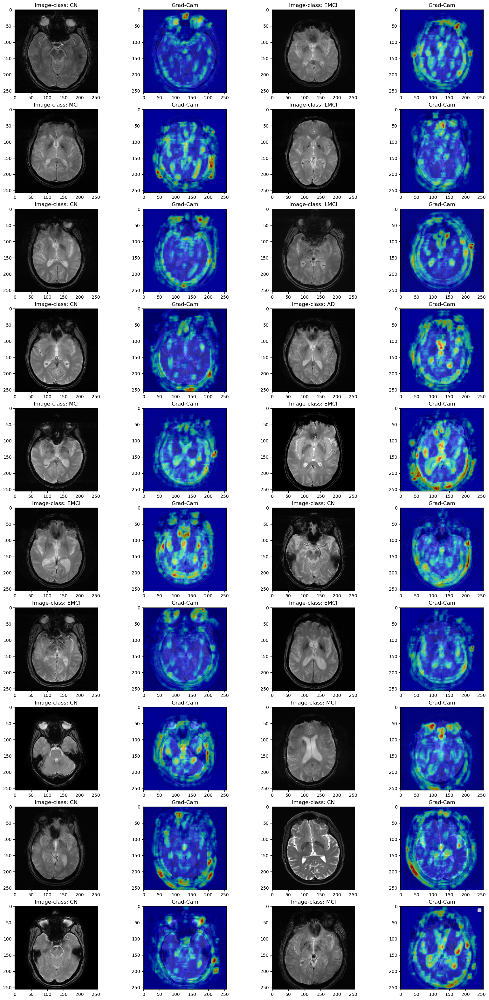

In [193]:
draw_compare(images[80:120], heatmaps[80:120], l[80:120],class_mapping)